In [56]:
!pip install ultralytics

import cv2
import numpy as np
import sys
from ultralytics import YOLO
from sklearn.cluster import KMeans

def get_grass_color(img):
    """
    Finds the color of the grass in the background of the image

    Args:
        img: np.array object of shape (WxHx3) that represents the BGR value of the
        frame pixels .

    Returns:
        grass_color
            Tuple of the BGR value of the grass color in the image
    """
    # Convert image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([30, 40, 40])
    upper_green = np.array([80, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Calculate the mean value of the pixels that are not masked
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    grass_color = cv2.mean(img, mask=mask)
    return grass_color[:3]

def get_players_boxes(result):
  """
  Finds the images of the players in the frame and their bounding boxes.

  Args:
      result: ultralytics.engine.results.Results object that contains all the
      result of running the object detection algroithm on the frame

  Returns:
      players_imgs
          List of np.array objects that contain the BGR values of the cropped
          parts of the image that contains players.
      players_boxes
          List of ultralytics.engine.results.Boxes objects that contain various
          information about the bounding boxes of the players found in the image.
  """
  players_imgs = []
  players_boxes = []
  for box in result.boxes:
    # Move tensor to CPU before converting to NumPy
    label = int(box.cls.cpu().numpy()[0])  # Changed this line
    if label == 0:
      # Move tensor to CPU before converting to NumPy
      x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())  # Changed this line
      player_img = result.orig_img[y1: y2, x1: x2]
      players_imgs.append(player_img)
      players_boxes.append(box)
  return players_imgs, players_boxes

def get_kits_colors(players, grass_hsv=None, frame=None):
  """
  Finds the kit colors of all the players in the current frame

  Args:
      players: List of np.array objects that contain the BGR values of the image
      portions that contain players.
      grass_hsv: tuple that contain the HSV color value of the grass color of
      the image background.

  Returns:
      kits_colors
          List of np arrays that contain the BGR values of the kits color of all
          the players in the current frame
  """
  kits_colors = []
  if grass_hsv is None:
	  grass_color = get_grass_color(frame)
	  grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

  for player_img in players:
      # Convert image to HSV color space
      hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

      # Define range of green color in HSV
      lower_green = np.array([grass_hsv[0, 0, 0] - 10, 40, 40])
      upper_green = np.array([grass_hsv[0, 0, 0] + 10, 255, 255])

      # Threshold the HSV image to get only green colors
      mask = cv2.inRange(hsv, lower_green, upper_green)

      # Bitwise-AND mask and original image
      mask = cv2.bitwise_not(mask)
      upper_mask = np.zeros(player_img.shape[:2], np.uint8)
      upper_mask[0:player_img.shape[0]//2, 0:player_img.shape[1]] = 255
      mask = cv2.bitwise_and(mask, upper_mask)

      kit_color = np.array(cv2.mean(player_img, mask=mask)[:3])

      kits_colors.append(kit_color)
  return kits_colors

def get_kits_classifier(kits_colors):
  """
  Creates a K-Means classifier that can classify the kits accroding to their BGR
  values into 2 different clusters each of them represents one of the teams

  Args:
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.

  Returns:
      kits_kmeans
          sklearn.cluster.KMeans object that can classify the players kits into
          2 teams according to their color..
  """
  kits_kmeans = KMeans(n_clusters=2)
  kits_kmeans.fit(kits_colors);
  return kits_kmeans

def classify_kits(kits_classifer, kits_colors):
  """
  Classifies the player into one of the two teams according to the player's kit
  color

  Args:
      kits_classifer: sklearn.cluster.KMeans object that can classify the
      players kits into 2 teams according to their color.
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.

  Returns:
      team
          np.array object containing a single integer that carries the player's
          team number (0 or 1)
  """
  team = kits_classifer.predict(kits_colors)
  return team

def get_left_team_label(players_boxes, kits_colors, kits_clf):
  """
  Finds the label of the team that is on the left of the screen

  Args:
      players_boxes: List of ultralytics.engine.results.Boxes objects that
      contain various information about the bounding boxes of the players found
      in the image.
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.
      kits_clf: sklearn.cluster.KMeans object that can classify the players kits
      into 2 teams according to their color.
  Returns:
      left_team_label
          Int that holds the number of the team that's on the left of the image
          either (0 or 1)
  """
  left_team_label = 0
  team_0 = []
  team_1 = []

  for i in range(len(players_boxes)):
    x1, y1, x2, y2 = map(int, players_boxes[i].xyxy[0].numpy())

    team = classify_kits(kits_clf, [kits_colors[i]]).item()
    if team==0:
      team_0.append(np.array([x1]))
    else:
      team_1.append(np.array([x1]))

  team_0 = np.array(team_0)
  team_1 = np.array(team_1)

  if np.average(team_0) - np.average(team_1) > 0:
    left_team_label = 1

  return left_team_label

def annotate_video(video_path, model):
    """
    Loads the input video and runs the object detection algorithm on its frames, finally it annotates the frame with
    the appropriate labels

    Args:
        video_path: String the holds the path of the input video
        model: Object that represents the trained object detection model
    Returns:
    """
    cap = cv2.VideoCapture(video_path)

    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

    video_name = video_path.split('/')[-1]
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    output_video = cv2.VideoWriter('./output/'+video_name.split('.')[0] + "_out.mp4",
                                   fourcc,
                                   30.0,
                                   (width, height))

    kits_clf = None
    left_team_label = 0
    grass_hsv = None

    while cap.isOpened():
        # Read a frame from the video
        success, frame = cap.read()

        current_frame_idx = cap.get(cv2.CAP_PROP_POS_FRAMES)
        if success:

            # Run YOLOv8 inference on the frame
            annotated_frame = cv2.resize(frame, (width, height))
            result = model(annotated_frame, conf=0.5, verbose=False)[0]

            # Get the players boxes and kit colors
            players_imgs, players_boxes = get_players_boxes(result)
            kits_colors = get_kits_colors(players_imgs, grass_hsv, annotated_frame)

            # Run on the first frame only
            if current_frame_idx == 1:
                kits_clf = get_kits_classifier(kits_colors)
                left_team_label = get_left_team_label(players_boxes, kits_colors, kits_clf)
                grass_color = get_grass_color(result.orig_img)
                grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

            for box in result.boxes:
                # Move tensor to CPU before converting to NumPy
                label = int(box.cls.cpu().numpy()[0])
                # Move tensor to CPU before converting to NumPy
                x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

                # If the box contains a player, find to which team he belongs
                if label == 0:
                    kit_color = get_kits_colors([result.orig_img[y1: y2, x1: x2]], grass_hsv)
                    team = classify_kits(kits_clf, kit_color)
                    if team == left_team_label:
                        label = 0
                    else:
                        label = 1

                # If the box contains a Goalkeeper, find to which team he belongs
                elif label == 1:
                    if x1 < 0.5 * width:
                        label = 2
                    else:
                        gk_label = 3

                # Increase the label by 2 because of the two add labels "Player-L", "GK-L"
                else:
                    label = label + 2

                cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), box_colors[str(label)], 2)
                cv2.putText(annotated_frame, labels[label], (x1 - 30, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9,
                            box_colors[str(label)], 2)

            # Write the annotated frame
            output_video.write(annotated_frame)

        else:
            # Break the loop if the end of the video is reached
            break

    cv2.destroyAllWindows()
    output_video.release()
    cap.release()

if __name__ == "__main__":

    labels = ["Player-L", "Player-R", "GK-L", "GK-R", "Ball", "Main Ref", "Side Ref", "Staff"]
    box_colors = {
        "0": (150, 50, 50),
        "1": (37, 47, 150),
        "2": (41, 248, 165),
        "3": (166, 196, 10),
        "4": (155, 62, 157),
        "5": (123, 174, 213),
        "6": (217, 89, 204),
        "7": (22, 11, 15)
    }
    model = YOLO("./weights/last.pt")
    video_path = sys.argv[1]
    annotate_video(video_path, model)

In [63]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
from google.colab import drive
drive.mount('/content/drive')

# Copy the dataset.zip from the correct path
!cp "/content/drive/MyDrive/Football/dataset.zip" ./

# Unzip the dataset and clean up
!unzip -q ./dataset.zip && rm ./dataset.zip

# Move the extracted dataset to the Data folder
!mv ./soccerNet_yolo8_dataset_new ./Data/

# Optional: If you want to remove the original Football 2.0 folder
!rm -r "/content/drive/MyDrive/Football 2.0/"

# Define dataset paths
DATA_PATH = './Data/'
TRAIN_SET_PATH = DATA_PATH + 'train/'
VAL_SET_PATH = DATA_PATH + 'val/'
TEST_SET_PATH = DATA_PATH + 'test/'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
rm: cannot remove '/content/drive/MyDrive/Football 2.0/': No such file or directory


In [4]:
import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  labels = data['names']

print("Labels are:")
for i, label in enumerate(labels):
  print(str(i) + ' - ' + label)

Labels are:
0 - Player team left
1 - Player team right
2 - Goalkeeper team left
3 - Goalkeeper team right
4 - Ball
5 - Main referee
6 - Side referee
7 - Staff members


In [5]:
import os

train_images_count =  len(os.listdir(TRAIN_SET_PATH + 'images/'))
validation_images_count = len(os.listdir(VAL_SET_PATH + 'images/'))
test_images_count = len(os.listdir(TEST_SET_PATH + 'images/'))

print("Train set images count: ", train_images_count)
print("Validation set images count: ", validation_images_count)
print("Test set images count: ", test_images_count)

Train set images count:  10212
Validation set images count:  1276
Test set images count:  1276


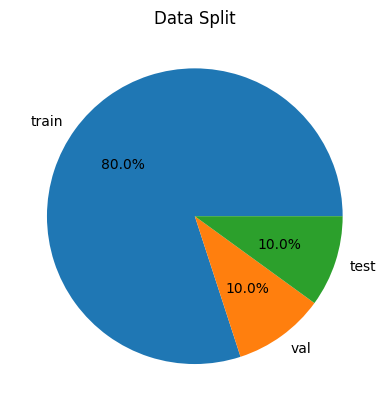

In [6]:
import matplotlib.pyplot as plt
import numpy as np

data = np.array([train_images_count, validation_images_count, test_images_count])
plt.pie(data,
        labels=['train', 'val', 'test'],
        autopct='%1.1f%%')
plt.title('Data Split')
plt.show();

4674.png


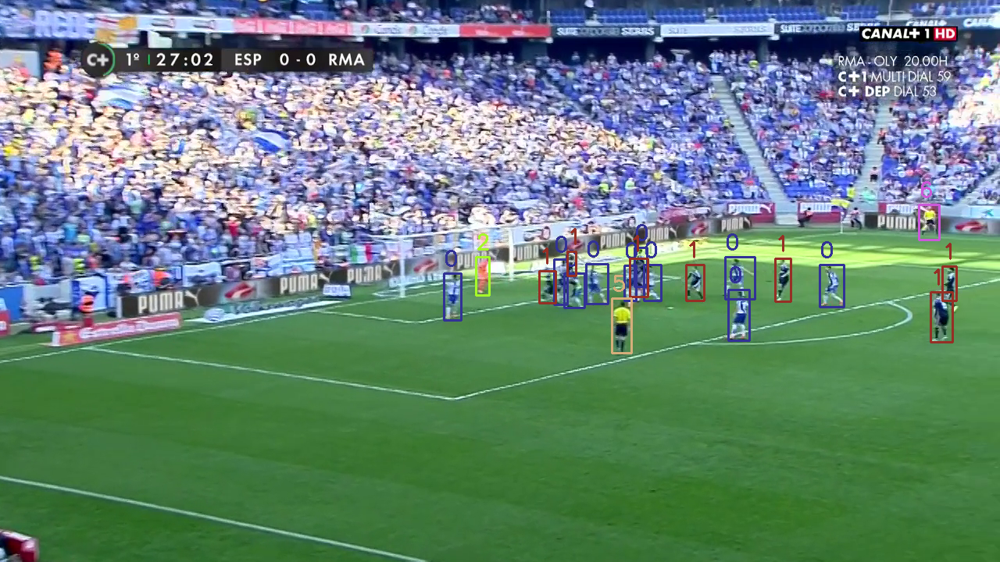

3062.png


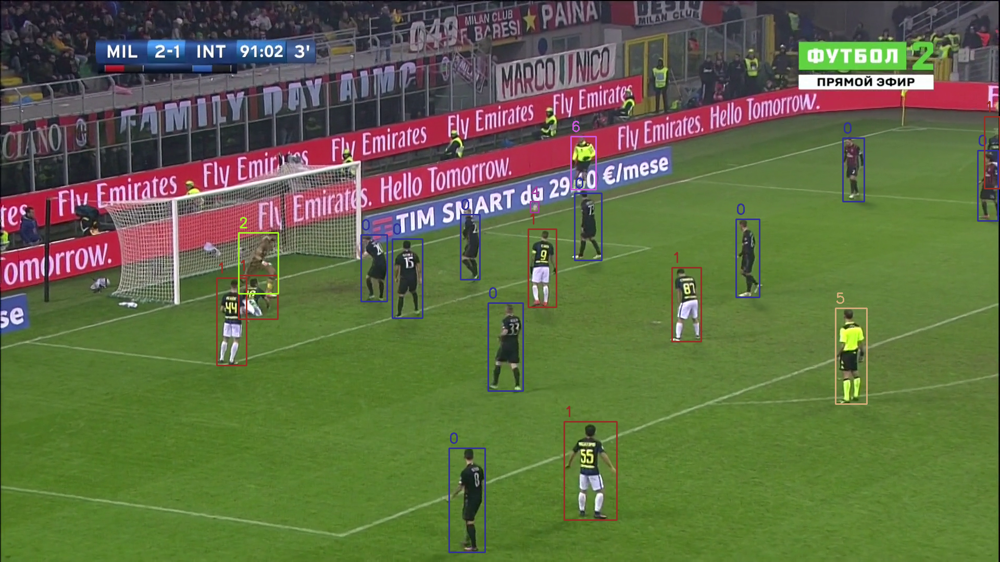

12119.png


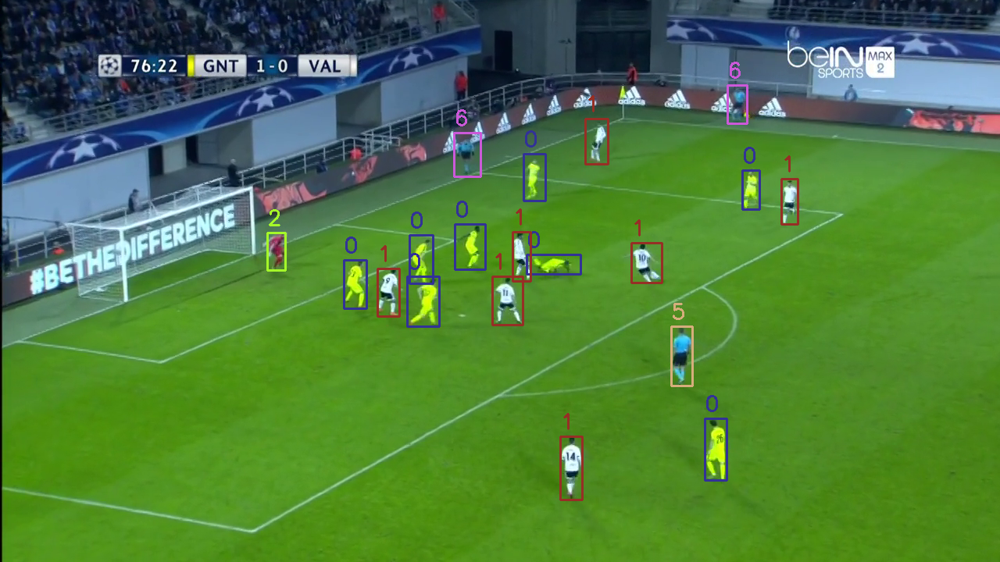

6509.png


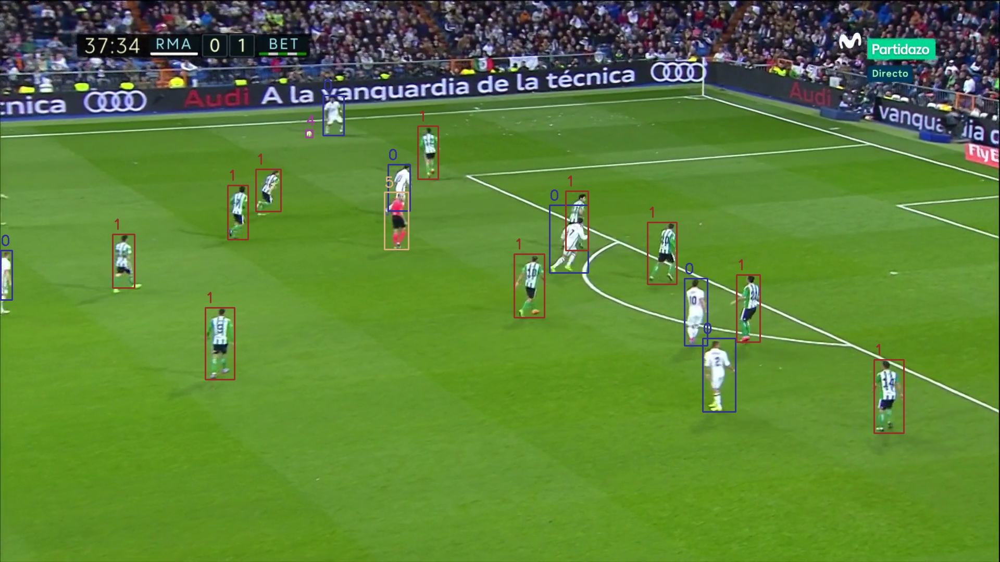

1590.png


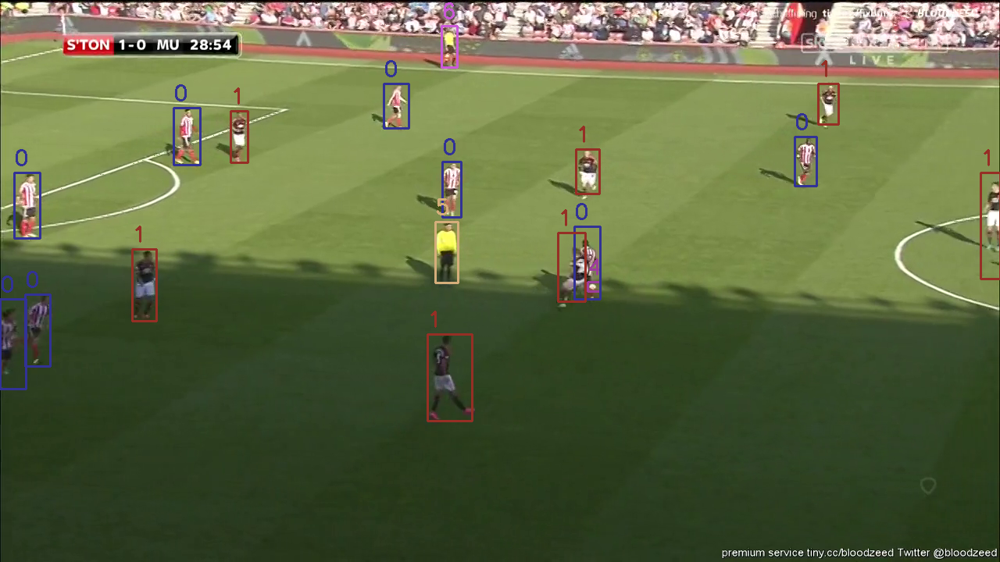

In [7]:
import os
import random
random.seed(15)
import cv2
from google.colab.patches import cv2_imshow

box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}
train_images_names = os.listdir(TRAIN_SET_PATH + 'images/')
random_images = random.sample(train_images_names, k=5)

for img_name in random_images:
  print(img_name)
  img = cv2.imread(TRAIN_SET_PATH + 'images/' + img_name)

  with open(TRAIN_SET_PATH + 'labels/' + img_name.split('.')[0] + '.txt') as f:
    bounding_boxes = f.readlines()

  for box in bounding_boxes:
    box = box.strip().split()
    label, x, y, w, h = int(box[0]), float(box[1]), float(box[2]), float(box[3]), float(box[4])

    # Convert YOLO format to OpenCV format
    x1 = int((x - w / 2) * img.shape[1])
    y1 = int((y - h / 2) * img.shape[0])
    x2 = int((x + w / 2) * img.shape[1])
    y2 = int((y + h / 2) * img.shape[0])

    # Draw the bounding box and label
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[str(label)], 2)
    cv2.putText(img, str(label), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[str(label)], 2)

  cv2_imshow(img);

In [8]:
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt

labels_dir = TRAIN_SET_PATH + 'labels/'
label_freq = [0] * len(labels)
scales = []
aspect_ratios = []
label_scale = [0] * len(labels)

for labels_file in tqdm(os.listdir(labels_dir)):
    # Load the bounding box information from the current file
    with open(os.path.join(labels_dir, labels_file), 'r') as f:
        bounding_boxes = f.readlines()

    # Update the information
    for box in bounding_boxes:
        box = box.strip().split()
        label, w, h = int(box[0]), float(box[3]), float(box[4])

        scale = w * h
        aspect_ratio = w/h

        label_freq[label] += 1
        scales.append(scale)
        label_scale[label] += scale
        aspect_ratios.append(aspect_ratio)

# Print the label frequencies
print()
print('#' * 100)
for label, freq in enumerate(label_freq):
    print(f'{labels[label]}: {freq}')

100%|██████████| 10212/10212 [00:00<00:00, 11946.66it/s]


####################################################################################################
Player team left: 60852
Player team right: 60915
Goalkeeper team left: 3729
Goalkeeper team right: 3449
Ball: 7798
Main referee: 7146
Side referee: 5361
Staff members: 2211


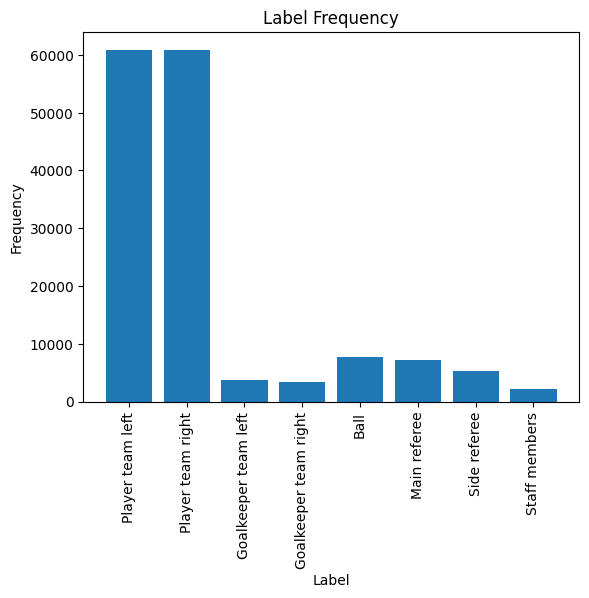

In [10]:
plt.bar(labels, label_freq)
plt.xlabel('Label')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title("Label Frequency")
plt.show()

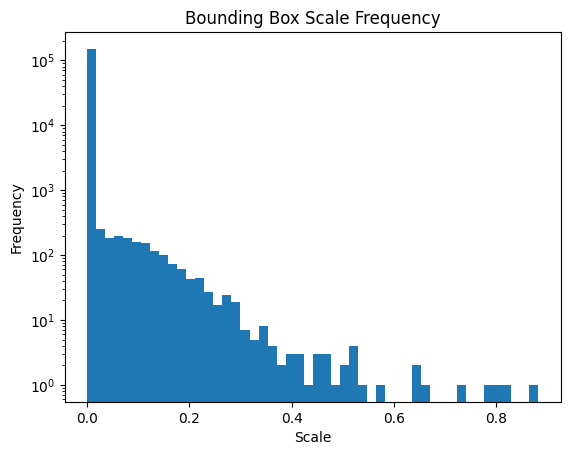

In [11]:
plt.hist(scales, bins=50)
plt.xlabel('Scale')
plt.ylabel('Frequency')
plt.yscale('log')
plt.title("Bounding Box Scale Frequency")
plt.show()

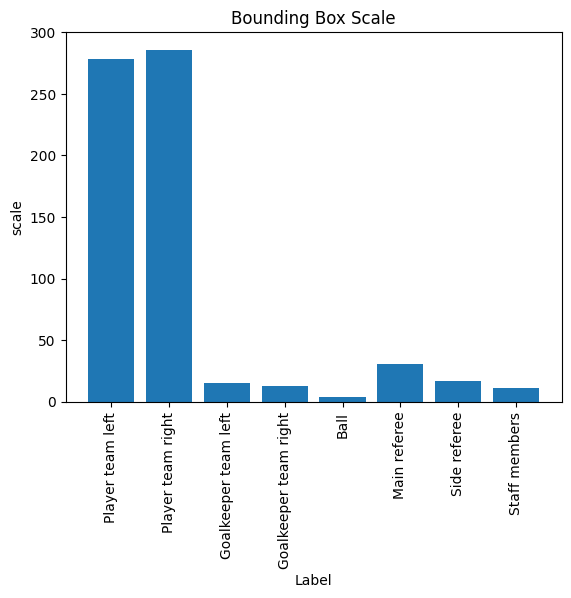

In [12]:
plt.bar(labels, label_scale)
plt.xlabel('Label')
plt.ylabel('scale')
plt.xticks(rotation=90)
plt.title("Bounding Box Scale")
plt.show()

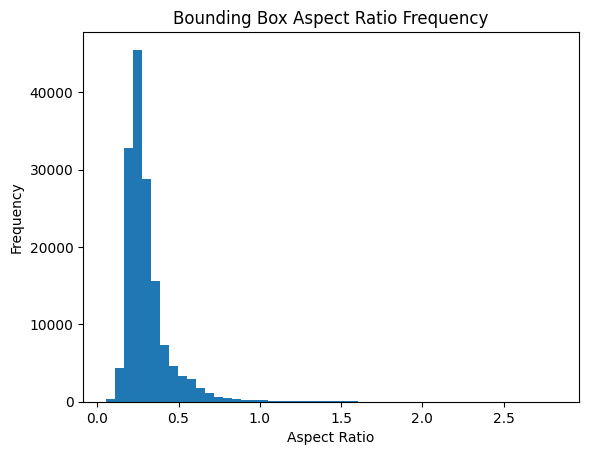

In [13]:
plt.hist(aspect_ratios, bins=50)
plt.xlabel('Aspect Ratio')
plt.ylabel('Frequency')
plt.title("Bounding Box Aspect Ratio Frequency")
plt.show()

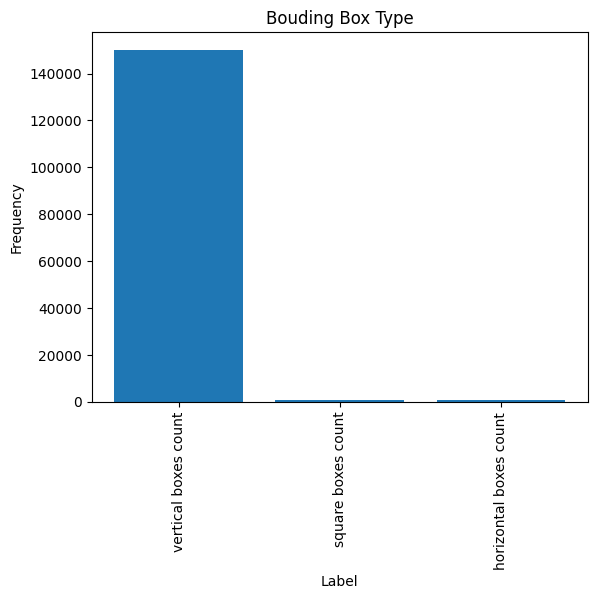

In [14]:
vertical_boxes_count = np.sum([ratio < 0.9 for ratio in aspect_ratios])
square_boxes_count = np.sum([ratio > 0.9 and ratio < 1.1 for ratio in aspect_ratios])
horizontal_boxes_count = np.sum([ratio > 1.1 for ratio in aspect_ratios])

plt.bar(['vertical boxes count', 'square boxes count', 'horizontal boxes count'],
        [vertical_boxes_count, square_boxes_count, horizontal_boxes_count])
plt.xlabel('Label')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title("Bouding Box Type")
plt.show()

In [15]:
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt
import os

images_dir = TRAIN_SET_PATH + 'images/'
resolutions = Counter()

for image_name in tqdm(os.listdir(images_dir)):
    image = plt.imread(images_dir + image_name)
    h, w = image.shape[: 2]
    resolutions[(w, h)] += 1

# Print the label frequencies
print()
print('#' * 100)
for resolution, freq in resolutions.items():
    print(f'{resolution}: {freq}')

100%|██████████| 10212/10212 [06:43<00:00, 25.34it/s]


####################################################################################################
(1920, 1080): 3237
(1280, 720): 6877
(854, 480): 51
(704, 576): 16
(1366, 768): 31


In [16]:
with open('/content/Data/train/labels/1.txt', 'r') as f:
    lines = f.read()
print(lines)


4 0.35838020833333334 0.475375 0.011208333333333324 0.020564814814814796 
0 0.47624479166666667 0.43303703703703705 0.0199583333333333 0.09946296296296292 
0 0.47496875000000005 0.41456481481481483 0.02986458333333335 0.11533333333333333 
0 0.48367968749999996 0.46938888888888897 0.037838541666666656 0.09842592592592593 
0 0.8728984375 0.39079166666666665 0.015473958333333352 0.0915462962962963 
0 0.7112760416666667 0.490800925925926 0.025052083333333405 0.11345370370370374 
0 0.6857890624999999 0.39946759259259257 0.013942708333333324 0.0948425925925926 
0 0.27930208333333334 0.462712962962963 0.018552083333333337 0.07118518518518513 
0 0.6293828124999999 0.4403287037037037 0.019901041666666685 0.10287962962962964 
0 0.39029166666666665 0.4514768518518519 0.02106250000000003 0.0940648148148148 
0 0.4122369791666667 0.4826388888888889 0.045088541666666634 0.04137037037037038 
1 0.5997760416666666 0.5595046296296297 0.040625 0.12623148148148142 
1 0.9217604166666666 0.5098611111111111 0

In [17]:
import os
from tqdm import tqdm

labels_mapping = {
    '0': '0',
    '1': '0',
    '2': '1',
    '3': '1',
    '4': '2',
    '5': '3',
    '6': '4',
    '7': '5'
}

for dataset_path in [TRAIN_SET_PATH, VAL_SET_PATH]:
  print('Working on ' + TRAIN_SET_PATH)
  labels_path = dataset_path + 'labels/'

  for label_file_name in tqdm(os.listdir(labels_path)):
    label_file_path = labels_path + label_file_name

    with open(label_file_path, 'r') as f:
      lines = f.readlines()

    with open(label_file_path, 'w') as f:
      for line in lines:
        label = line.split()[0]
        line = line.replace(label, labels_mapping[label], 1)
        f.write(line)
  print()

Working on ./Data/train/


100%|██████████| 10212/10212 [00:04<00:00, 2075.16it/s]



Working on ./Data/train/


100%|██████████| 1276/1276 [00:00<00:00, 1974.07it/s]

In [18]:
with open('/content/Data/train/labels/1.txt', 'r') as f:
    lines = f.read()
print(lines)


2 0.35838020833333334 0.475375 0.011208333333333324 0.020564814814814796 
0 0.47624479166666667 0.43303703703703705 0.0199583333333333 0.09946296296296292 
0 0.47496875000000005 0.41456481481481483 0.02986458333333335 0.11533333333333333 
0 0.48367968749999996 0.46938888888888897 0.037838541666666656 0.09842592592592593 
0 0.8728984375 0.39079166666666665 0.015473958333333352 0.0915462962962963 
0 0.7112760416666667 0.490800925925926 0.025052083333333405 0.11345370370370374 
0 0.6857890624999999 0.39946759259259257 0.013942708333333324 0.0948425925925926 
0 0.27930208333333334 0.462712962962963 0.018552083333333337 0.07118518518518513 
0 0.6293828124999999 0.4403287037037037 0.019901041666666685 0.10287962962962964 
0 0.39029166666666665 0.4514768518518519 0.02106250000000003 0.0940648148148148 
0 0.4122369791666667 0.4826388888888889 0.045088541666666634 0.04137037037037038 
0 0.5997760416666666 0.5595046296296297 0.040625 0.12623148148148142 
0 0.9217604166666666 0.5098611111111111 0

In [19]:

import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  print(data)

{'names': ['Player team left', 'Player team right', 'Goalkeeper team left', 'Goalkeeper team right', 'Ball', 'Main referee', 'Side referee', 'Staff members'], 'nc': 8, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


In [20]:
new_labels = ['Player', 'GoalKeeper', 'Ball', 'Main Referee', 'Side Referee', 'Staff Member']

with open(DATA_PATH + 'data.yaml', 'r') as f:
  data = yaml.safe_load(f)
data['nc'] = len(new_labels)
data['names'] = new_labels
with open(DATA_PATH + 'data.yaml', 'w') as f:
  yaml.safe_dump(data, f)

In [21]:
import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  print(data)

{'names': ['Player', 'GoalKeeper', 'Ball', 'Main Referee', 'Side Referee', 'Staff Member'], 'nc': 6, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


In [23]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8m.yaml').load('yolov8m.pt')  # build from YAML and transfer weights

# Train the model
results = model.train(data='/content/Data/data.yaml', lr0=0.03, epochs=10, imgsz=720, batch=16, resume=True, project='/content/drive/MyDrive/Football/yolov8')


Transferred 475/475 items from pretrained weights
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/Data/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=720, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/Football/yolov8, name=train, exist_ok=False, pretrained=yolov8m.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=None, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_t

train: Scanning /content/Data/train/labels... 10212 images, 0 backgrounds, 0 corrupt: 100%|██████████| 10212/10212 [01:23<00:00, 121.98it/s]


train: New cache created: /content/Data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.0 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/Data/val/labels... 1276 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1276/1276 [00:11<00:00, 111.32it/s]

val: New cache created: /content/Data/val/labels.cache


Plotting labels to /content/drive/MyDrive/Football/yolov8/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.03' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 736 train, 736 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Football/yolov8/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      9.03G     0.9426     0.6614     0.9412         63        736: 100%|██████████| 639/639 [10:50<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:45<00:00,  1.13s/it]


                   all       1276      18895      0.766      0.672      0.735      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      9.05G     0.9395     0.5278      0.942         55        736: 100%|██████████| 639/639 [10:44<00:00,  1.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:43<00:00,  1.10s/it]


                   all       1276      18895      0.811      0.754      0.793      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      8.93G     0.9311     0.5044     0.9392         52        736: 100%|██████████| 639/639 [10:36<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:48<00:00,  1.22s/it]

                   all       1276      18895      0.806      0.761        0.8       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      8.97G     0.9122     0.4838     0.9315         66        736: 100%|██████████| 639/639 [10:40<00:00,  1.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:43<00:00,  1.08s/it]


                   all       1276      18895      0.812      0.746      0.801      0.574

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      9.07G      0.897     0.4685     0.9275         44        736: 100%|██████████| 639/639 [10:28<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:46<00:00,  1.15s/it]

                   all       1276      18895      0.832       0.77      0.811      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         9G     0.8788      0.447     0.9207         65        736: 100%|██████████| 639/639 [10:30<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:43<00:00,  1.10s/it]


                   all       1276      18895      0.828      0.773      0.814      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      9.08G     0.8682     0.4341     0.9181         48        736: 100%|██████████| 639/639 [10:27<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:46<00:00,  1.17s/it]

                   all       1276      18895      0.844      0.803      0.833      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      8.97G     0.8543     0.4196     0.9142         64        736: 100%|██████████| 639/639 [10:29<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:43<00:00,  1.10s/it]

                   all       1276      18895      0.842      0.816      0.841      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      9.06G     0.8388     0.4025      0.908         43        736: 100%|██████████| 639/639 [10:30<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:44<00:00,  1.12s/it]

                   all       1276      18895      0.846      0.828       0.85      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      9.07G     0.8237     0.3884     0.9023         64        736: 100%|██████████| 639/639 [10:28<00:00,  1.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:43<00:00,  1.08s/it]


                   all       1276      18895      0.863      0.821      0.853      0.629

10 epochs completed in 1.905 hours.
Optimizer stripped from /content/drive/MyDrive/Football/yolov8/train/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/Football/yolov8/train/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/Football/yolov8/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:46<00:00,  1.16s/it]


                   all       1276      18895      0.862      0.823      0.853      0.629
                Player       1270      15231      0.947      0.959      0.979      0.778
            GoalKeeper        830        845      0.858      0.904      0.905      0.681
                  Ball        994        994      0.756      0.468      0.539      0.233
          Main Referee        883        886      0.965      0.959      0.986      0.842
          Side Referee        570        693      0.859      0.898      0.906      0.605
          Staff Member        131        246      0.786      0.747      0.804      0.635
Speed: 0.2ms preprocess, 7.5ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to /content/drive/MyDrive/Football/yolov8/train


In [25]:
from ultralytics import YOLO

# Load a model
model = YOLO("/content/drive/MyDrive/Football/yolov8/train/weights/best.pt")


image 1/1 /content/Data/train/images/157.png: 416x736 13 Players, 1 Main Referee, 1 Side Referee, 56.7ms
Speed: 2.8ms preprocess, 56.7ms inference, 8.7ms postprocess per image at shape (1, 3, 416, 736)


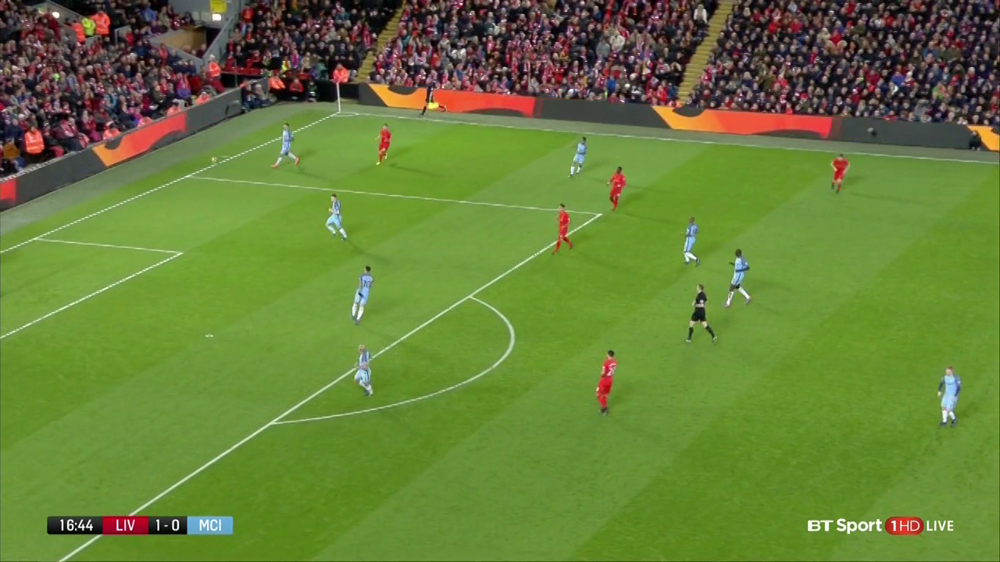

In [26]:
from google.colab.patches import cv2_imshow
results = model.predict(source="/content/Data/train/images/157.png", conf=0.5)
result = results[0]
cv2_imshow(result.orig_img)

In [27]:

import random

random.seed(15)
box_colors = []
labels = ['Player', 'GK', 'Ball', 'Main Ref', 'Side Ref', 'Staff']
for label in labels:
  box_colors.append(tuple(random.randint(0, 255) for _ in range(3)))

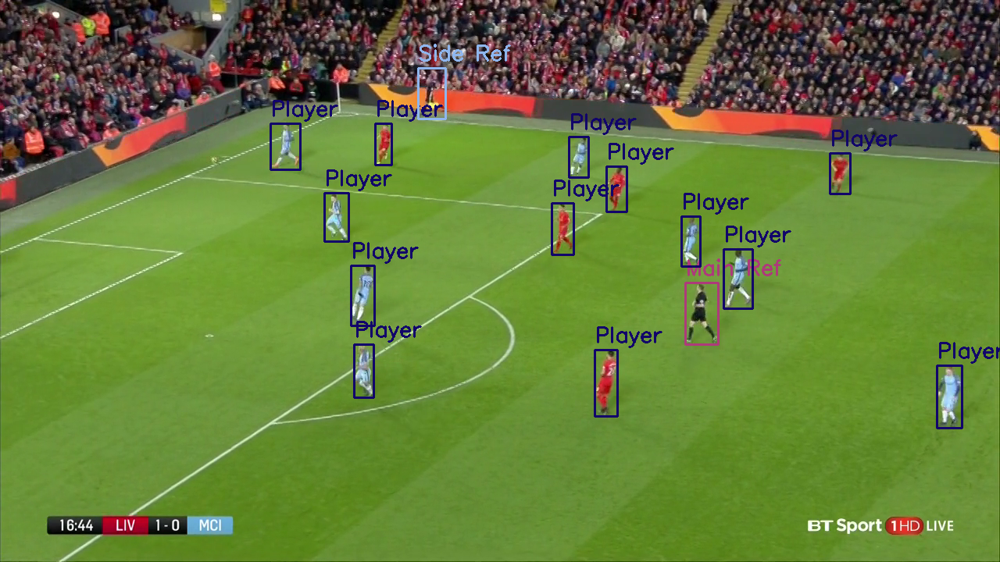

In [29]:
import cv2
from google.colab.patches import cv2_imshow

img = result.orig_img.copy()

for box in result.boxes:
  # Use .cpu() to move tensors to CPU before converting to NumPy
  label = int(box.cls.cpu().numpy()[0])
  x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

  # Draw the bounding box and label
  cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
  cv2.putText(img, labels[label], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[int(label)], 2)

cv2_imshow(img);

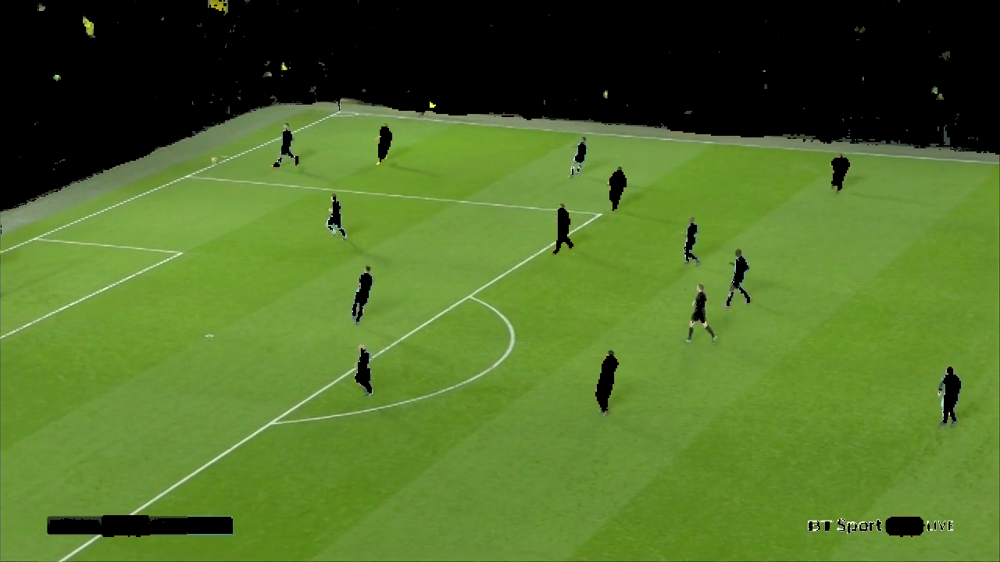

Grass BGR color:  (53.95960946650855, 147.50698347798883, 106.90536983550741)


In [30]:
import numpy as np

# Convert image to HSV color space
img = result.orig_img.copy()
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define a large range of green color in HSV
lower_green = np.array([30, 40, 40])
upper_green = np.array([80, 255, 255])

# Threshold the HSV image to get only green colors
mask = cv2.inRange(hsv, lower_green, upper_green)

# Calculate the mean value of the pixels that are not masked
masked_img = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(masked_img)
grass_color = cv2.mean(img, mask=mask)
grass_color = grass_color[:3]
print("Grass BGR color: ", grass_color)

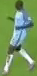

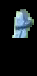

Player Kit Color: 


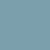

####################################################################################################


Player Kit Color: 


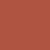

####################################################################################################


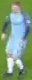

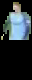

Player Kit Color: 


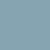

####################################################################################################


Player Kit Color: 


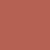

####################################################################################################


Player Kit Color: 


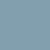

####################################################################################################


Player Kit Color: 


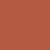

####################################################################################################


Player Kit Color: 


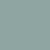

####################################################################################################


Player Kit Color: 


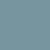

####################################################################################################


Player Kit Color: 


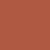

####################################################################################################


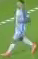

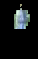

Player Kit Color: 


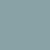

####################################################################################################


Player Kit Color: 


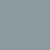

####################################################################################################


Player Kit Color: 


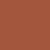

####################################################################################################


Player Kit Color: 


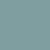

####################################################################################################


In [32]:
kits_colors = []
grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

for box in result.boxes:
  # Move the tensor to the CPU using .cpu() before converting to NumPy
  label = int(box.cls.cpu().numpy()[0])
  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())  # Move to CPU here as well
    player_img = result.orig_img[y1: y2, x1: x2]
    cv2_imshow(player_img)
    # Convert image to HSV color space
    hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([grass_hsv[0, 0, 0] - 10, 40, 40])
    upper_green = np.array([grass_hsv[0, 0, 0] + 10, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Bitwise-AND mask and original image
    mask = cv2.bitwise_not(mask)

    upper_mask = np.zeros(player_img.shape[:2], np.uint8)
    upper_mask[0:player_img.shape[0]//2, 0:player_img.shape[1]] = 255
    mask = cv2.bitwise_and(mask, upper_mask)

    masked_img = cv2.bitwise_and(player_img, player_img, mask=mask)
    cv2_imshow(masked_img)

    player_kit_color = np.array(cv2.mean(player_img, mask=mask)[:3])
    kits_colors.append(player_kit_color)

    print("Player Kit Color: ")
    demo_color = np.repeat(player_kit_color[np.newaxis, ...], 50, axis=0)
    demo_color = np.repeat(demo_color[np.newaxis, ...], 50, axis=0)
    cv2_imshow(demo_color)
    print('#' * 100)

In [33]:
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

kits_kmeans = KMeans(n_clusters=2)
kits_kmeans.fit(kits_colors);

In [34]:
kits_colors = np.array(kits_colors)

In [35]:
import plotly.express as px

fig = px.scatter_3d(
    x=kits_colors[:, 2],
    y=kits_colors[:, 1],
    z=kits_colors[:, 0],
    range_x=[0, 255],
    range_y=[0, 255],
    range_z=[0, 255],
    title="Kits Colors"
    )
fig.update_traces(marker_size = 10)
fig.update_traces(marker_color = list(map(lambda e: (e[2], e[1], e[0]), kits_colors)))

fig.add_scatter3d(
    x=[kits_kmeans.cluster_centers_[0, 2]],
    y=[kits_kmeans.cluster_centers_[0, 1]],
    z=[kits_kmeans.cluster_centers_[0, 0]],
)

fig.add_scatter3d(
    x=[kits_kmeans.cluster_centers_[1, 2]],
    y=[kits_kmeans.cluster_centers_[1, 1]],
    z=[kits_kmeans.cluster_centers_[1, 0]],
)

for i, d in enumerate(fig.data[-2:]):
  d.marker.symbol='cross'
  d.marker.color=kits_kmeans.cluster_centers_[i, ::-1]

fig.show()

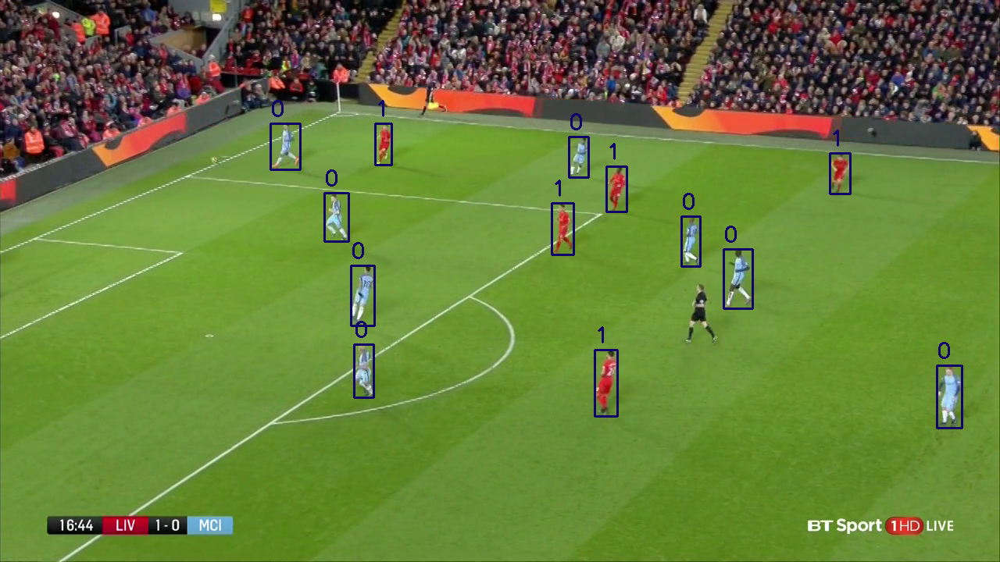

In [37]:
import cv2
from google.colab.patches import cv2_imshow

result = results[0]
img = result.orig_img.copy()
i = 0
for box in result.boxes:
  # Use .cpu() to move the tensor to the CPU before converting to NumPy
  label = int(box.cls.cpu().numpy()[0]) # Changed this line

  if label == 0:
    # Use .cpu() to move the tensor to the CPU before converting to NumPy
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy()) # Changed this line

    # Draw the bounding box and label
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
    team = kits_kmeans.labels_[i]
    cv2.putText(img, str(team), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[int(label)], 2)
    i += 1

cv2_imshow(img);

Team Left is Team 0


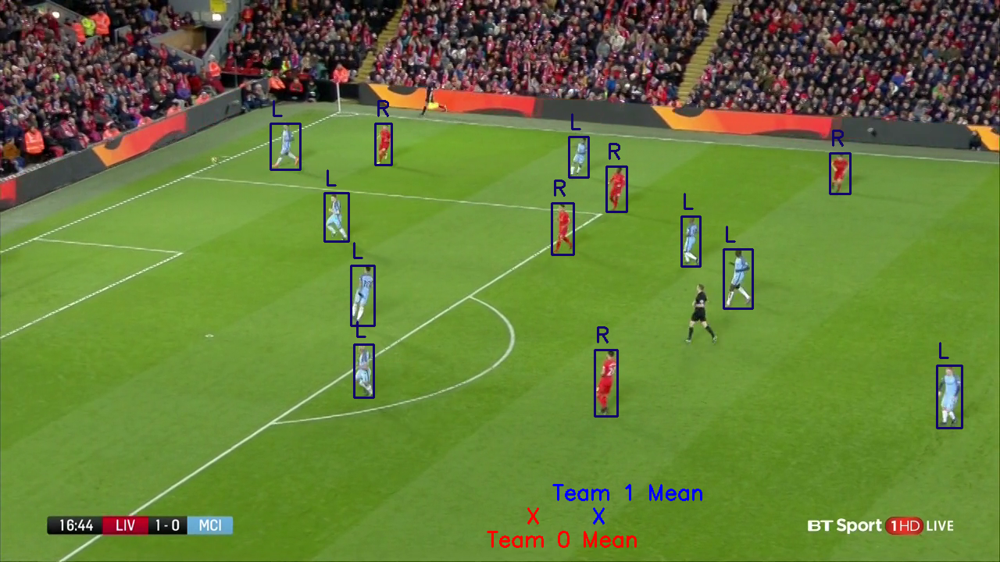

In [39]:
img = result.orig_img.copy()

team_0 = []
team_1 = []

i = 0
team_left = 0
for box in result.boxes:
  # Use .cpu() to move the tensor to the CPU before converting to NumPy
  label = int(box.cls.cpu().numpy()[0]) # Changed this line

  if label == 0:
    # Use .cpu() to move the tensor to the CPU before converting to NumPy
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy()) # Changed this line

    # Draw the bounding box and label
    team = kits_kmeans.labels_[i]
    if team==0:
      team_0.append(np.array([x1]))
    else:
      team_1.append(np.array([x1]))
    i += 1

if (np.mean(team_1) < np.mean(team_0)):
  team_left = 1

i = 0
for box in result.boxes:
  # Use .cpu() to move the tensor to the CPU before converting to NumPy
  label = int(box.cls.cpu().numpy()[0]) # Changed this line

  if label == 0:
    # Use .cpu() to move the tensor to the CPU before converting to NumPy
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy()) # Changed this line
    team = kits_kmeans.labels_[i]
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
    cv2.putText(img, "L" if team==team_left else "R", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9,
                box_colors[int(label)], 2)
    i += 1
cv2.putText(img, "X", (np.mean(team_0).astype(int), img.shape[0] - 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
cv2.putText(img, "Team 0 Mean", (np.mean(team_0).astype(int) - 50, img.shape[0] - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
cv2.putText(img, "X", (np.mean(team_1).astype(int), img.shape[0] - 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
cv2.putText(img, "Team 1 Mean", (np.mean(team_1).astype(int) - 50, img.shape[0] - 80), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

print("Team Left is Team", team_left)
cv2_imshow(img);

In [41]:
import locale
def getpreferredencoding(do_set=True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!gdown 13T68qyKVBDNxzby8nTXOUYIWE-Aml6M9
!gdown 164lzTf2lWjB7Zd1nPhak7PJvVEJ2eX_M
!gdown 13dgWxD7nIHxaK3bm_MrH2FLcCcywONcQ

Downloading...
From: https://drive.google.com/uc?id=13T68qyKVBDNxzby8nTXOUYIWE-Aml6M9
To: /content/ArsTot.mp4
100% 98.0M/98.0M [00:08<00:00, 11.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=164lzTf2lWjB7Zd1nPhak7PJvVEJ2eX_M
To: /content/wimbeldon2.mp4
100% 39.6M/39.6M [00:03<00:00, 12.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=13dgWxD7nIHxaK3bm_MrH2FLcCcywONcQ
To: /content/CityUtdR.mp4
100% 3.45M/3.45M [00:00<00:00, 56.4MB/s]


In [42]:
def get_grass_color(img):
    """
    Finds the color of the grass in the background of the image

    Args:
        img: np.array object of shape (WxHx3) that represents the BGR value of the
        frame pixels .

    Returns:
        grass_color
            Tuple of the BGR value of the grass color in the image
    """
    # Convert image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([30, 40, 40])
    upper_green = np.array([80, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Calculate the mean value of the pixels that are not masked
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    grass_color = cv2.mean(img, mask=mask)
    return grass_color[:3]


In [49]:
def get_players_boxes(result):
  """
  Finds the images of the players in the frame and their bounding boxes.

  Args:
      result: ultralytics.engine.results.Results object that contains all the
      result of running the object detection algroithm on the frame

  Returns:
      players_imgs
          List of np.array objects that contain the BGR values of the cropped
          parts of the image that contains players.
      players_boxes
          List of ultralytics.engine.results.Boxes objects that contain various
          information about the bounding boxes of the players found in the image.
  """
  players_imgs = []
  players_boxes = []
  for box in result.boxes:
    # Use .cpu() to move tensors to CPU before converting to NumPy
    label = int(box.cls.cpu().numpy()[0])  # Changed this line
    if label == 0:
      # Use .cpu() to move tensors to CPU before converting to NumPy
      x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())  # Changed this line
      player_img = result.orig_img[y1: y2, x1: x2]
      players_imgs.append(player_img)
      players_boxes.append(box)
  return players_imgs, players_boxes

In [44]:
def get_kits_colors(players, grass_hsv=None, frame=None):
  """
  Finds the kit colors of all the players in the current frame

  Args:
      players: List of np.array objects that contain the BGR values of the image
      portions that contain players.
      grass_hsv: tuple that contain the HSV color value of the grass color of
      the image background.

  Returns:
      kits_colors
          List of np.array objects that contain the BGR values of the kits color
          of all the players in the current frame
  """
  kits_colors = []
  if grass_hsv is None:
      grass_color = get_grass_color(frame)
      grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

  for player_img in players:
      # Convert image to HSV color space
      hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

      # Define range of green color in HSV
      lower_green = np.array([grass_hsv[0, 0, 0] - 10, 40, 40])
      upper_green = np.array([grass_hsv[0, 0, 0] + 10, 255, 255])

      # Threshold the HSV image to get only green colors
      mask = cv2.inRange(hsv, lower_green, upper_green)

      # Bitwise-AND mask and original image
      mask = cv2.bitwise_not(mask)
      upper_mask = np.zeros(player_img.shape[:2], np.uint8)
      upper_mask[0:player_img.shape[0]//2, 0:player_img.shape[1]] = 255
      mask = cv2.bitwise_and(mask, upper_mask)

      kit_color = np.array(cv2.mean(player_img, mask=mask)[:3])

      kits_colors.append(kit_color)
  return kits_colors

In [45]:
def get_kits_classifier(kits_colors):
  """
  Creates a K-Means classifier that can classify the kits accroding to their BGR
  values into 2 different clusters each of them represents one of the teams

  Args:
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.

  Returns:
      kits_kmeans
          sklearn.cluster.KMeans object that can classify the players kits into
          2 teams according to their color..
  """
  kits_kmeans = KMeans(n_clusters=2)
  kits_kmeans.fit(kits_colors);
  return kits_kmeans

In [46]:
def classify_kits(kits_classifer, kits_colors):
  """
  Classifies the player into one of the two teams according to the player's kit
  color

  Args:
      kits_classifer: sklearn.cluster.KMeans object that can classify the
      players kits into 2 teams according to their color.
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.

  Returns:
      team
          np.array object containing a single integer that carries the player's
          team number (0 or 1)
  """
  team = kits_classifer.predict(kits_colors)
  return team

In [58]:
def get_left_team_label(players_boxes, kits_colors, kits_clf):
  """
  Finds the label of the team that is on the left of the screen

  Args:
      players_boxes: List of ultralytics.engine.results.Boxes objects that
      contain various information about the bounding boxes of the players found
      in the image.
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.
      kits_clf: sklearn.cluster.KMeans object that can classify the players kits
      into 2 teams according to their color.
  Returns:
      left_team_label
          Int that holds the number of the team that's on the left of the image
          either (0 or 1)
  """
  left_team_label = 0
  team_0 = []
  team_1 = []

  for i in range(len(players_boxes)):
    # Move the tensor to the CPU using .cpu() before converting to NumPy
    x1, y1, x2, y2 = map(int, players_boxes[i].xyxy[0].cpu().numpy())  # Changed this line

    team = classify_kits(kits_clf, [kits_colors[i]]).item()
    if team==0:
      team_0.append(np.array([x1]))
    else:
      team_1.append(np.array([x1]))

  team_0 = np.array(team_0)
  team_1 = np.array(team_1)

  # Check if team_0 or team_1 are empty before calculating the average
  # This avoids potential errors when no players are detected for a team.
  if team_0.size and team_1.size:  # Check if both arrays are not empty
      if np.average(team_0) - np.average(team_1) > 0:
          left_team_label = 1
  elif team_0.size:  # If only team_0 has players, it's on the left
      left_team_label = 0
  elif team_1.size: # If only team_1 has players, it's on the left
      left_team_label = 1
  else: #If neither teams have any players return 0 by default
      left_team_label = 0

  return left_team_label

In [65]:
labels = ["Player-L", "Player-R", "GK-L", "GK-R", "Ball", "Main Ref", "Side Ref", "Staff"]
box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}


import cv2
import numpy as np
from ultralytics import YOLO
from sklearn.cluster import KMeans

model = YOLO("/content/drive/MyDrive/Football/yolov8/train/weights/best.pt")

cap = cv2.VideoCapture("/content/ArsTot.mp4")

height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

fourcc = cv2.VideoWriter_fourcc(*'MP4V')
output_video = cv2.VideoWriter('/content/drive/MyDrive/Football/Output/ArsTot.mp4',
                         fourcc,
                         60.0,
                         (width, height))

kits_clf = None
left_team_label = 0
grass_hsv = None

while cap.isOpened():
  # Read a frame from the video
  success, frame = cap.read()

  current_frame_idx = cap.get(cv2.CAP_PROP_POS_FRAMES)
  if success:

    # Run YOLOv8 inference on the frame
    annotated_frame = cv2.resize(frame, (width, height))
    result = model(annotated_frame, conf=0.5, verbose=False)[0]

    # Get the players boxes and kit colors
    players_imgs, players_boxes = get_players_boxes(result)
    kits_colors = get_kits_colors(players_imgs, grass_hsv, annotated_frame)

    # Run on the first frame only
    if current_frame_idx == 1:
      kits_clf = get_kits_classifier(kits_colors)
      left_team_label = get_left_team_label(players_boxes, kits_colors, kits_clf)
      grass_color = get_grass_color(result.orig_img)
      grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

    for box in result.boxes:

      label = int(box.cls.cpu().numpy()[0])

      x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

      # If the box contains a player, find to which team he belongs
      if label == 0:
        kit_color = get_kits_colors([result.orig_img[y1: y2, x1: x2]], grass_hsv)
        team = classify_kits(kits_clf, kit_color)
        if team == left_team_label:
          label = 0
        else:
          label = 1

      # If the box contains a Goalkeeper, find to which team he belongs
      elif label == 1:
        if x1 < 0.5 * width:
          label = 2
        else:
          gk_label = 3

      # Increase the label by 2 because of the two add labels "Player-L", "GK-L"
      else:
        label = label + 2

      cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), box_colors[str(label)], 2)
      cv2.putText(annotated_frame, labels[label], (x1 - 30, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[str(label)], 2)

    # Write the annotated frame
    output_video.write(annotated_frame)
  else:
      # Break the loop if the end of the video is reached
      break

cv2.destroyAllWindows()
output_video.release()
cap.release()